In [0]:
dbutils.fs.ls('dbfs:/FileStore/tables/ash_test') # Test Data
file_location = "/FileStore/tables/ash_test/train_data.csv" # Train Data

### Import Libraries

###### Preprocessing, Encoding & EDA

In [0]:
from pyspark.sql import Row
from pyspark import SparkConf, SparkContext, SQLContext
from pyspark.sql import SparkSession
from pyspark.sql.types import StringType, FloatType, DoubleType, DecimalType
from pyspark.sql.functions import udf
from pyspark.sql import functions as F 
from pyspark.sql.functions import explode, col, udf, mean as _mean, stddev as _stddev, log, log10, countDistinct,avg, format_number, when
from pyspark.sql.types import StructType,StructField
from pyspark.sql.functions import lit
from pyspark.sql.functions import isnan, when, count, col
import pyspark.sql.types as tp

#ML
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, OneHotEncoder
from pyspark.ml.linalg import Vectors
from pyspark.ml.stat import Correlation
from pyspark.ml.feature import VectorAssembler,StandardScaler, PCA
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
from pyspark.mllib.evaluation import BinaryClassificationMetrics, MulticlassMetrics
from pyspark.ml.classification import RandomForestClassifier, GBTClassifier, DecisionTreeClassifier, LogisticRegression, LinearSVC
from pyspark.ml.classification import NaiveBayes

#Python libraries for plotting
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [0]:
#Define schema
my_schema = tp.StructType([
  tp.StructField(name= 'id',dataType= tp.StringType(),   nullable= True),
  tp.StructField(name= 'spkid',dataType= tp.StringType(),   nullable= True),
  tp.StructField(name= 'full_name',dataType= tp.StringType(),   nullable= True),
  tp.StructField(name= 'pdes',dataType= tp.StringType(),   nullable= True),
  tp.StructField(name= 'name',dataType= tp.StringType(),   nullable= True),
  tp.StructField(name= 'prefix',dataType= tp.StringType(),   nullable= True),
  tp.StructField(name= 'neo',dataType= tp.StringType(),   nullable= True),
  tp.StructField(name= 'pha',dataType= tp.StringType(),   nullable= True),
  tp.StructField(name= 'H',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'diameter',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'albedo',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'diameter_sigma',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'orbit_id',dataType= tp.StringType(),   nullable= True),
  tp.StructField(name= 'epoch',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'epoch_mjd',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'epoch_cal',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'equinox',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'e',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'a',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'q',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'i',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'om',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'w',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'ma',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'ad',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'n',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'tp',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'tp_cal',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'per',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'per_y',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'moid',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'moid_ld',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'sigma_e',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'sigma_a',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'sigma_q',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'sigma_i',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'sigma_om',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'sigma_w',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'sigma_ma',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'sigma_ad',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'sigma_n',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'sigma_tp',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'sigma_per',dataType= tp.DoubleType(),   nullable= True),
  tp.StructField(name= 'class',dataType= tp.StringType(),   nullable= True),
  tp.StructField(name= 'rms',dataType= tp.DoubleType(),   nullable= True)])

#Load Data
df = spark.read.csv('/FileStore/tables/ash_test/train_data.csv', schema=my_schema, header = 'true')
df.printSchema()
display(df)
df = df.persist()

id,spkid,full_name,pdes,name,prefix,neo,pha,H,diameter,albedo,diameter_sigma,orbit_id,epoch,epoch_mjd,epoch_cal,equinox,e,a,q,i,om,w,ma,ad,n,tp,tp_cal,per,per_y,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,class,rms
bK13N34R,3921151,(2013 NR34),2013 NR34,null,null,N,N,19.1,null,null,null,1,2459000.5,59000.0,2.0200531E7,null,0.2395140902948033,2.467962162977906,1.8768504506302568,4.2847086382780155,187.4435648528415,162.4326374957067,252.60662934088057,3.0590738753255535,0.2542121643500829,2459422.955671756,2.0210727455671802E7,1416.139943265003,3.8771798583572994,0.871481,339.15426077,1.6637999999999999E-6,2.8261999999999997E-7,3.9211000000000005E-6,2.1708000000000003E-5,1.2328E-4,0.0013828,7.827999999999999E-4,3.5030999999999997E-7,4.3666E-8,0.0030714,2.4325E-4,MBA,0.54462
bK15P50H,3725394,(2015 PH50),2015 PH50,null,null,N,N,19.699,null,null,null,JPL 3,2457245.5,57245.0,2.0150811E7,null,0.2369724826300891,2.365728138761921,1.805115668491649,3.2149011772728504,58.35429368550654,290.4174436760314,345.8561643481903,2.926340609032194,0.2708674508386901,2457297.716815302,2.01510022168153E7,1329.063344027966,3.63877712259539,0.801128,311.77498376,0.0033089,0.015305000000000001,0.0056419,0.024416999999999998,0.57431,4.3121,2.1855,0.018932,0.0026285,8.4517,12.897,MBA,0.49686
a0443673,2443673,443673 (2015 HD155),443673,null,null,N,N,16.4,null,null,null,9,2459000.5,59000.0,2.0200531E7,null,0.2503428686832137,2.715705981368436,2.0358483554925,11.03984398082382,236.99168698795668,51.7185707883975,349.60064228534617,3.3955636072443722,0.2202317605851152,2459047.7200634778,2.02007172200635E7,1634.641611380422,4.4754048223967695,1.04054,404.9469518,4.5209000000000005E-8,4.5365E-8,1.28E-7,9.3045E-6,3.9713000000000004E-5,4.5833999999999995E-5,2.832E-5,5.6721E-8,5.518300000000001E-9,1.2943E-4,4.0959E-5,MBA,0.5393
bK16U95M,3762976,(2016 UM95),2016 UM95,null,null,N,N,19.048,null,null,null,4,2459000.5,59000.0,2.0200531E7,null,0.1392587161510286,2.5278053684836403,2.17578643818893,6.0638148322223,22.79156041768309,350.82965423869337,335.73666891094086,2.8798242987783484,0.2452384858901295,2459099.4376973235,2.0200906937697303E7,1467.958826663468,4.01905222905809,1.1768,457.97525599999994,0.0011692999999999999,0.0040728000000000006,0.0064406,0.050769999999999996,0.050185,0.72613,0.29743,0.00464,5.927E-4,1.4209,3.5478,MBA,0.51993
bK08CM9K,3961319,(2008 CK229),2008 CK229,null,null,N,N,17.6,null,null,null,JPL 2,2459000.5,59000.0,2.0200531E7,null,0.1246940298255613,2.58183895862292,2.2598990545115965,4.448999521990394,58.92993336985667,351.3884285789563,53.224126541995325,2.9037788627342414,0.2375802577731892,2458776.4741190583,2.01910199741191E7,1515.277419825352,4.14860347659234,1.27057,494.46772689999995,1.2554E-7,4.8201E-8,3.3747E-7,1.3807999999999999E-5,7.825699999999999E-5,9.8129E-5,4.7211000000000006E-5,5.4211999999999996E-8,6.6532E-9,2.0218E-4,4.2433999999999994E-5,MBA,0.39566999999999997
bK09Sa6V,3880734,(2009 SV366),2009 SV366,null,null,N,N,16.7,null,null,null,JPL 2,2459000.5,59000.0,2.0200531E7,null,0.1806618239919973,2.6104014333183607,2.138801549023742,15.47269809537461,96.54669521691801,327.7133701350686,166.9163030554445,3.08200131761298,0.2336916123727959,2458286.2411468015,2.0180616741146803E7,1540.491746129557,4.21763653971131,1.16784,454.4882928,5.7705E-8,3.2518E-8,1.5127E-7,6.938200000000001E-6,2.9595E-5,3.8224E-5,2.8154000000000002E-5,3.8392E-8,4.3666E-9,1.1492E-4,2.8785E-5,MBA,0.5758
a0203787,2203787,203787 (2002 TH22),203787,null,null,N,N,16.2,null,null,null,12,2459000.5,59000.0,2.0200531E7,null,0.2803519266124396,2.968650154672411,2.1363833643716843,1.088762837313048,210.8479264807232,164.188599159001,157.80261965459292,3.8009169449731384,0.192692824714768,2458181.5664466196,2.01803040664466E7,1868.258460235284,5.11501289592138,1.13758,442.7120086,5.2589999999999996E-8,2.2447E-8,1.6369E-7,5.3079E-6,3.8975E-4,3.9002E-4,1.7393E-5,2.8739999999999998E-8,2.1855E-9,8.332700

In [0]:
print(df.count())
pha_count = df.groupBy('pha').count()
display(pha_count)

pha,count
Y,1653
N,749229


In [0]:
#Grouping the NEO(Near Earth Orbit) flag
neo_count = df.groupBy('neo').count()
display(neo_count)

neo,count
null,2
Y,18369
N,732511


In [0]:
class_count = df.groupBy('class').count()
display(class_count)

class,count
OMB,22261
IEO,20
ATE,1380
TJN,6531
APO,10183
AST,61
TNO,2728
IMB,15869
MCA,14778
HYA,2


### Exploratory Data Analysis
###### The following program was written via Python in order to make use of both MatPlotLib and Seborn libraries.  The rest of the code incorporates PySpark.

In [0]:
# df_train = spark.read.csv('/FileStore/tables/train_data.csv', schema=my_schema, header = 'true')
# df_test = spark.read.csv('/FileStore/tables/test_data.csv', schema=my_schema, header = 'true')

In [0]:
# df_train = df_train.toPandas()
# df_test = df_test.toPandas()

# df = pd.concat([df_train, df_test], ignore_index=True)
# print(f'Combined No. of Rows: {df.shape[0]}, Combined No, of Coloumns: {df.shape[1]}')

# df.head(3)

##### Potentially Hazardous Data

In [0]:
# df_pha = df[df.pha ==  'Y']
# print(f'Combined No. of Rows: {df_pha.shape[0]}, Combined No, of Coloumns: {df_pha.shape[1]}')
# df_pha.head(3)

##### Non-Hazardous Data

In [0]:
# df_sad = df[df.pha ==  'N']
# print(f'Combined No. of Rows: {df_sad.shape[0]}, Combined No, of Coloumns: {df_sad.shape[1]}')
# df_sad.head(3)

##### Data Visualizations

###### AVG AMP

In [0]:
# amp_sad = df_sad["H"].mean()
# amp_pha = df_pha["H"].mean()

# amp = {'pha':amp_pha,'safe':amp_sad}

In [0]:
# plt.bar(range(len(amp)), list(amp.values()), align='center')
# plt.xticks(range(len(amp)), list(amp.keys()))

# plt.title('Average AMP of Hazardous vs Non-Hazardous Asteroids')
# plt.xlabel('classification')
# plt.ylabel('avg_absolute_magnitude_parameter')

# plt.show()

###### AVG Diameters

In [0]:
# dia_sad = df_sad["diameter"].mean()
# dia_pha = df_pha["diameter"].mean()

# dia_sig_sad = df_sad["diameter_sigma"].mean()
# dia_sig_pha = df_pha["diameter_sigma"].mean()

# dia = pd.DataFrame({'pha':[dia_pha,dia_sig_pha],'safe':[dia_sad,dia_sig_sad]}).T
# dia = dia.rename(columns={0: "diameter", 1: "diameter_sigma"})

# dia['classification'] = dia.index

In [0]:
# labels = dia['classification']
# diameter = dia['diameter']
# diameter_sigma = dia['diameter_sigma']

# x = np.arange(len(labels))  # the label locations
# width = 0.35  # the width of the bars

# fig, ax = plt.subplots()
# rects1 = ax.bar(x - width/2, diameter, width, label='avg_diameter')
# rects2 = ax.bar(x + width/2, diameter_sigma, width, label='avg_diameter_sigma')

# # Add some text for labels, title and custom x-axis tick labels, etc.
# ax.set_ylabel('avg_diameter')
# ax.set_xlabel('classification')
# ax.set_title('Diameter vs Diameter Sigma Averages (in KM)')
# ax.set_xticks(x)
# ax.set_xticklabels(labels)
# ax.legend()

###### PHA Class Types

In [0]:
# pha_class = pd.DataFrame(df_pha['class'].value_counts())
# pha_class['classification'] = pha_class.index

# pos = np.arange(len(pha_class['classification']))
# width = 0.5     # gives histogram aspect to the bar diagram

# ax = plt.axes()
# ax.set_xticks(pos + (width/2))
# ax.set_xticklabels(pha_class['classification'])

# ax.set_title('PHA Class Histogram')
# ax.set_ylabel('class_count')
# ax.set_xlabel('class')

# plt.bar(pos, pha_class['class'], width, color='g')
# plt.show()

In [0]:
# pha_class

###### Non-Hazardous Class Types

In [0]:
# sad_class = pd.DataFrame(df_sad['class'].value_counts())
# sad_class['classification'] = sad_class.index

# pos = np.arange(len(sad_class['classification']))
# width = 0.5     # gives histogram aspect to the bar diagram

# ax = plt.axes()
# ax.set_xticks(pos + (width/2))
# ax.set_xticklabels(sad_class['classification'])

# ax.set_title('PHA Class Histogram')
# ax.set_ylabel('class_count')
# ax.set_xlabel('class')

# plt.bar(pos, sad_class['class'], width, color='purple')
# plt.show()

In [0]:
# sad_class

#### Pre Process Data

In [0]:
def pre_process(df):

  # Drop columns we dont need
  df = df.drop(*['id','spkid', 'full_name','orbit_id','pdes', 'name', 'prefix','equinox', 'diameter', 'albedo', 'diameter_sigma', 'epoch', 'orbit_id','epoch_mjd', 'epoch_cal'])
  df = df.na.fill(df.select(F.format_number(F.mean(df['H']),2)).collect()[0][0],subset="H") # filling with the mean
  #df = df.na.fill('Y', subset = 'neo') #using a conservative approach of filling neo with Y  
  df = df.withColumn("neo",F.when((F.col("neo").isNull()) & (F.col("q") < 1.3), "Y").when((F.col("neo").isNull()) & (F.col("q") >= 1.3), "N").otherwise(F.col("neo")))
  #df = df.na.fill(0) #Fill the rest of features  with Zero if there are any nulls. this is because there are only a handful which are nulls
  df = df.na.drop(how='any')
  # Index Labels
  #Set up Stages for pipeline 
  stage_1 = StringIndexer(inputCol="pha", outputCol="label") #this will be the target label
  stage_2 = StringIndexer(inputCol="neo", outputCol="neo_index")
  stage_3 = StringIndexer(inputCol="class", outputCol="class_index")
  stage_4 = OneHotEncoder(inputCol="class_index",outputCol="class_ohe")

  pipeline = Pipeline(stages=[stage_1, stage_2, stage_3, stage_4])
  pipeline_model = pipeline.fit(df)

  df = pipeline_model.transform(df)
  df = df.drop(*['neo','pha','class','class_index']) #These features no longer needed since we have converted to index and ohe
  
  return df
df_processed = pre_process(df)

In [0]:
display(df_processed)

H,e,a,q,i,om,w,ma,ad,n,tp,tp_cal,per,per_y,moid,moid_ld,sigma_e,sigma_a,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,rms,label,neo_index,class_ohe
19.1,0.2395140902948033,2.467962162977906,1.8768504506302568,4.2847086382780155,187.4435648528415,162.4326374957067,252.60662934088057,3.0590738753255535,0.2542121643500829,2459422.955671756,2.0210727455671802E7,1416.139943265003,3.8771798583572994,0.871481,339.15426077,1.6637999999999999E-6,2.8261999999999997E-7,3.9211000000000005E-6,2.1708000000000003E-5,1.2328E-4,0.0013828,7.827999999999999E-4,3.5030999999999997E-7,4.3666E-8,0.0030714,2.4325E-4,0.54462,0.0,0.0,"List(0, 11, List(0), List(1.0))"
19.699,0.2369724826300891,2.365728138761921,1.805115668491649,3.2149011772728504,58.35429368550654,290.4174436760314,345.8561643481903,2.926340609032194,0.2708674508386901,2457297.716815302,2.01510022168153E7,1329.063344027966,3.63877712259539,0.801128,311.77498376,0.0033089,0.015305000000000001,0.0056419,0.024416999999999998,0.57431,4.3121,2.1855,0.018932,0.0026285,8.4517,12.897,0.49686,0.0,0.0,"List(0, 11, List(0), List(1.0))"
16.4,0.2503428686832137,2.715705981368436,2.0358483554925,11.03984398082382,236.99168698795668,51.7185707883975,349.60064228534617,3.3955636072443722,0.2202317605851152,2459047.7200634778,2.02007172200635E7,1634.641611380422,4.4754048223967695,1.04054,404.9469518,4.5209000000000005E-8,4.5365E-8,1.28E-7,9.3045E-6,3.9713000000000004E-5,4.5833999999999995E-5,2.832E-5,5.6721E-8,5.518300000000001E-9,1.2943E-4,4.0959E-5,0.5393,0.0,0.0,"List(0, 11, List(0), List(1.0))"
19.048,0.1392587161510286,2.5278053684836403,2.17578643818893,6.0638148322223,22.79156041768309,350.82965423869337,335.73666891094086,2.8798242987783484,0.2452384858901295,2459099.4376973235,2.0200906937697303E7,1467.958826663468,4.01905222905809,1.1768,457.97525599999994,0.0011692999999999999,0.0040728000000000006,0.0064406,0.050769999999999996,0.050185,0.72613,0.29743,0.00464,5.927E-4,1.4209,3.5478,0.51993,0.0,0.0,"List(0, 11, List(0), List(1.0))"
17.6,0.1246940298255613,2.58183895862292,2.2598990545115965,4.448999521990394,58.92993336985667,351.3884285789563,53.224126541995325,2.9037788627342414,0.2375802577731892,2458776.4741190583,2.01910199741191E7,1515.277419825352,4.14860347659234,1.27057,494.46772689999995,1.2554E-7,4.8201E-8,3.3747E-7,1.3807999999999999E-5,7.825699999999999E-5,9.8129E-5,4.7211000000000006E-5,5.4211999999999996E-8,6.6532E-9,2.0218E-4,4.2433999999999994E-5,0.39566999999999997,0.0,0.0,"List(0, 11, List(0), List(1.0))"
16.7,0.1806618239919973,2.6104014333183607,2.138801549023742,15.47269809537461,96.54669521691801,327.7133701350686,166.9163030554445,3.08200131761298,0.2336916123727959,2458286.2411468015,2.0180616741146803E7,1540.491746129557,4.21763653971131,1.16784,454.4882928,5.7705E-8,3.2518E-8,1.5127E-7,6.938200000000001E-6,2.9595E-5,3.8224E-5,2.8154000000000002E-5,3.8392E-8,4.3666E-9,1.1492E-4,2.8785E-5,0.5758,0.0,0.0,"List(0, 11, List(0), List(1.0))"
16.2,0.2803519266124396,2.968650154672411,2.1363833643716843,1.088762837313048,210.8479264807232,164.188599159001,157.80261965459292,3.8009169449731384,0.192692824714768,2458181.5664466196,2.01803040664466E7,1868.258460235284,5.11501289592138,1.13758,442.7120086,5.2589999999999996E-8,2.2447E-8,1.6369E-7,5.3079E-6,3.8975E-4,3.9002E-4,1.7393E-5,2.8739999999999998E-8,2.1855E-9,8.332700000000001E-5,2.119E-5,0.5865100000000001,0.0,0.0,"List(0, 11, List(0), List(1.0))"
16.4,0.3004161866195726,3.086492018878315,2.159259856535146,4.163927679443685,156.1090193885375,157.4909471784951,260.5177115306226,4.013724181221484,0.1817633575581611,2459547.8176211407,2.0211129317621104E7,1980.5972162722962,5.422579647562751,1.14612,446.0355204,6.3937E-8,2.6732E-8,1.9487000000000002E-7,7.7623E-6,8.5094E-5,8.725E-5,1.369E-5,3.4763000000000005E-8,2.3614E-9,7.8789E-5,2.5730999999999998E-5,0.5997600000000001,0.0,0.0,"List(0, 11, List(0), List(1.0))"
17.3,0.083025890413696,2.702075993094219,2.4777337278020988,5.972178180650999

#### Feature Engineering

##### Correlation Analysis

In [0]:
# Correlation matrix function
def correlation_matrix(df):
  # Input - Processed dataframe with numeric columns and no null values
  # Output - Correlation matrix as a numpy array
  
  vector_col = "corr_features"
  assembler = VectorAssembler(inputCols=df.columns, outputCol=vector_col)
  df_vector = assembler.transform(df).select(vector_col)
  matrix = Correlation.corr(df_vector, vector_col)
  matrix_arr = matrix.collect()[0]["pearson({})".format(vector_col)].values
  num_cols = len(df.columns)
  matrix_arr = matrix_arr.reshape((num_cols,num_cols))
  
  return matrix_arr

# Function that returns the names of correlated columns to drop which are above the threshold
def cols_to_drop(corr_matrix, numeric_cols, threshold):
  # Input - Correlation matrix array, names of numeric columns and the threshold for filtering criteria
  # Output - Names of columns that are correlated to any other column above the given threshold
  
  tri = [] # Create array with lower matrix triangle
  for i, row in enumerate(corr_matrix):
    tri.append(row[:i])
  
  to_drop = [col_name for row, col_name in zip(tri, numeric_cols) if any(row > threshold)] #Column names to drop
  return to_drop



In [0]:
# Correlation matrix for all columns that are not vectors or labels
numeric_columns = [item[0] for item in df_processed.dtypes if (item[1].startswith('double')) & (item[0] != 'label')]
corr_matrix = correlation_matrix(df_processed.select(numeric_columns))

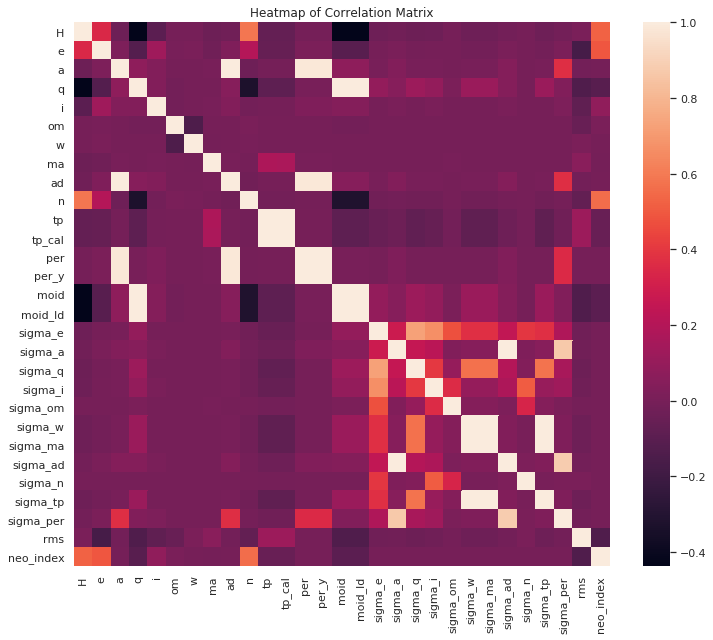

In [0]:
# Plot Correlation Matrix
sns.set()
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(corr_matrix, xticklabels=numeric_columns, yticklabels=numeric_columns, ax = ax).set(title = 'Heatmap of Correlation Matrix')

In [0]:
# Find the name of columns that are above correlation threshold from the correlation matrix
thresh = 0.98
to_drop = cols_to_drop(corr_matrix, numeric_cols=numeric_columns, threshold=thresh)
print(to_drop)

['ad', 'tp_cal', 'per', 'per_y', 'moid', 'moid_ld', 'sigma_ma', 'sigma_ad', 'sigma_tp']

In [0]:
# Drop the columns from the Processed dataframe
df_processed_new = df_processed.drop(*to_drop)

##### Standard Scaling

In [0]:
def standard_scale(df):
  #assembler = VectorAssembler(inputCols=['e','a','q','i','ma','n','tp','per','per_y','moid', 'moid_ld','sigma_e', 'sigma_a', 'sigma_q', 'sigma_i', 'sigma_om', 'sigma_w', 'sigma_ma', 'sigma_ad','sigma_n','sigma_tp','sigma_per','rms','neo_index','class_ohe'], outputCol='assembled_features')
  df_temp = df.drop(*['label'])
  assembler = VectorAssembler(inputCols=df_temp.columns, outputCol='assembled_features') 
    
  assembled = assembler.transform(df)
  scaler = StandardScaler(inputCol="assembled_features", outputCol="scaledFeatures",
                        withStd=True, withMean=True)
# Compute summary statistics by fitting the StandardScaler
  scalerModel = scaler.fit(assembled)

# Normalize each feature to have unit standard deviation.
  scaledData = scalerModel.transform(assembled)
  new_features = scaledData.select('scaledFeatures', 'label')
  
  return new_features, scalerModel
df_scaled, scalerModel = standard_scale(df_processed_new)

In [0]:
display(df_scaled)

scaledFeatures,label
"List(1, 31, List(), List(1.2274609638331735, 0.8953932959418716, -0.01159999487221637, -0.24157662207055758, -0.712465132463737, 0.18495841177028113, -0.18282689390365905, 0.7148966928734493, 0.21932273646475084, 0.3460530474806978, -0.007166609142082527, -0.0034900466431607657, -0.006743926932194823, -0.007596169697664987, -0.0028966820466604657, -0.006082098580128634, -0.0025386580471691905, -0.0030374101625999838, -0.19839212842220316, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0
"List(1, 31, List(), List(1.5602258359764638, 0.8680578352657388, -0.014117803842181031, -0.27487245182326886, -0.8742229280187078, -1.0697956461943838, 1.0494085250822593, 1.5968005411963047, 0.4270907508350716, -1.0143491530856428, -0.007131290273537516, -0.0034862039541887937, -0.006741995916797389, -0.007420175724375129, -0.0025009098979022425, -0.006082036429170007, -0.0022954804690768268, -0.0030369417260981903, -0.6858797280930754, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0
"List(1, 31, List(), List(-0.27248086385778597, 1.0118588110237339, -0.0054985857476067285, -0.16777745500677688, 0.3089296899831085, 0.6665685932467449, -1.2487799429280755, 1.632213795562441, -0.20456916251749896, 0.10585823564462443, -0.007166626427452939, -0.003490046702730449, -0.006743928231336702, -0.00759625917973586, -0.0028967396472457867, -0.006082098599404711, -0.0025386615764898704, -0.0030374101699476054, -0.25269351096510595, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0
"List(1, 31, List(), List(1.1985731952998644, -0.18287180198239678, -0.010126182599156906, -0.10282493910761047, -0.4434594408038317, -1.4154671607718698, 1.631056205117512, 1.5010958069207259, 0.10737969924965493, 0.13896358880442752, -0.007154139639766304, -0.00348902412067729, -0.006741722360967314, -0.007230058337048603, -0.0028621757897151073, -0.006082088130885235, -0.0024838271070166122, -0.0030372813081053153, -0.45040361996060013, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0
"List(1, 31, List(), List(0.394159948449308, -0.33951769813599897, -0.008795448932206126, -0.06378391507936107, -0.687623904347677, -1.0642004001810452, 1.6364360744460815, -1.1707555679426052, 0.011846377109562059, -0.06777099128310309, -0.007166625569576496, -0.0034900467020183897, -0.0067439281595929445, -0.007596226690317053, -0.0028967130798572167, -0.006082098598650733, -0.002538661471492032, -0.0030374101698940306, -1.7187287693555466, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0
"List(1, 31, List(), List(-0.10582066078101246, 0.26242628315056116, -0.008092015260842097, -0.11999154276004187, 0.9791892794168894, -0.6985636268979518, 1.408493036270001, -0.09551623314535945, -0.03666291355815794, -0.38157760752442627, -0.00716662629400478, -0.0034900467059560576, -0.0067439282233666955, -0.007596276250838718, -0.0028967466213231405, -0.0060820985995144305, -0.0025386616830419986, -0.00303741

##### Principle Component Analysis

In [0]:
# Initial Analysis with all the numeric columns
pca = PCA(k=len(df_processed_new.columns), inputCol="scaledFeatures", outputCol="pcaFeatures")
pca_model = pca.fit(df_scaled)
explained_variance = pca_model.explainedVariance
# print(pca_model.explainedVariance)
# df_pca = pca_model.transform(df_scaled)

In [0]:
percent_variance = list(map(lambda x: round(x/sum(explained_variance) *100, 3), explained_variance))

def accumu(lis):
    total = 0
    for x in lis:
        total += x
        yield total
# Get cumulative percent
cumulative_percent_variance = list(accumu(percent_variance))
# print(cumulative_percent_variance)

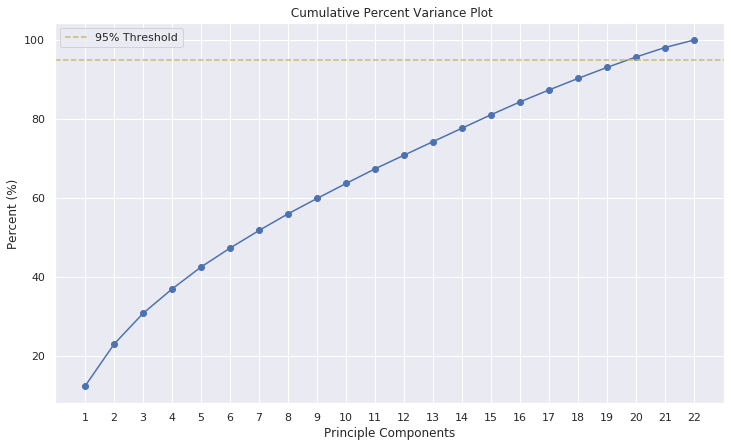

In [0]:
# Plot to show Percent Variance incremental increase

fig, ax = plt.subplots(figsize=(12,7))
ax.plot(range(1,len(percent_variance)+1), cumulative_percent_variance, marker='o')
ax.axhline(y=95, ls='--', c='y', label='95% Threshold')
ax.set(title=' Cumulative Percent Variance Plot', xlabel = 'Principle Components', ylabel='Percent (%)', xticks =list(range(1,len(percent_variance)+1)))
ax.legend()

In [0]:
# Selecting all Features which captures 100% of the variance in the dataset

pca = PCA(k=22, inputCol="scaledFeatures", outputCol="pcaFeatures")
pca_model = pca.fit(df_scaled)
# print(pca_model.explainedVariance)
df_pca = pca_model.transform(df_scaled)

In [0]:
display(df_pca)

scaledFeatures,label,pcaFeatures
"List(1, 31, List(), List(1.2274609638331735, 0.8953932959418716, -0.01159999487221637, -0.24157662207055758, -0.712465132463737, 0.18495841177028113, -0.18282689390365905, 0.7148966928734493, 0.21932273646475084, 0.3460530474806978, -0.007166609142082527, -0.0034900466431607657, -0.006743926932194823, -0.007596169697664987, -0.0028966820466604657, -0.006082098580128634, -0.0025386580471691905, -0.0030374101625999838, -0.19839212842220316, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0,"List(1, 22, List(), List(-0.5981177885447913, -0.1335563361335693, -0.7296266100162906, 0.12257139480587723, -0.4984719589299279, -0.13860203548568922, -0.16308334192694732, -0.282891108795094, -0.35169359464851874, 0.49000772946145155, -0.4276440921837562, 0.20134326224479493, 0.022783382576442947, 0.22112966444670243, 0.10240841987460957, -0.15152307971411294, 0.14875126666483768, 0.12318060665285926, 0.5106147506837481, -0.31248136719868724, -0.040859859599803414, -0.030429134011685316))"
"List(1, 31, List(), List(1.5602258359764638, 0.8680578352657388, -0.014117803842181031, -0.27487245182326886, -0.8742229280187078, -1.0697956461943838, 1.0494085250822593, 1.5968005411963047, 0.4270907508350716, -1.0143491530856428, -0.007131290273537516, -0.0034862039541887937, -0.006741995916797389, -0.007420175724375129, -0.0025009098979022425, -0.006082036429170007, -0.0022954804690768268, -0.0030369417260981903, -0.6858797280930754, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0,"List(1, 22, List(), List(-0.8491357929161031, 0.01223378079899522, -0.7011122055299921, 0.13086025978909066, -0.7620162716205561, -0.038856768373229995, -0.10699984026362422, -0.14503319599284134, 1.305000062008895, 0.43390888936487026, -0.44745395577560865, 0.2157473379850652, 0.16827341101338797, -0.15824005373717334, -0.049507954375607725, -0.20149131513251178, 0.5817337555264176, 0.009058447340700436, 2.1310218673744328, 0.08584260017583803, -0.02299318637096733, -0.06870045873486552))"
"List(1, 31, List(), List(-0.27248086385778597, 1.0118588110237339, -0.0054985857476067285, -0.16777745500677688, 0.3089296899831085, 0.6665685932467449, -1.2487799429280755, 1.632213795562441, -0.20456916251749896, 0.10585823564462443, -0.007166626427452939, -0.003490046702730449, -0.006743928231336702, -0.00759625917973586, -0.0028967396472457867, -0.006082098599404711, -0.0025386615764898704, -0.0030374101699476054, -0.25269351096510595, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0,"List(1, 22, List(), List(0.07708952746419248, -0.06732513905459711, -0.06777683910394082, 0.03966600004312457, -0.06256314584532358, -0.25290665313317645, -0.3179549472083532, -0.428894514504942, -1.4747120785593602, 1.0884875451429066, -0.17161654644712254, 0.06382345466596465, -0.1500722628546553, 0.3932060782845401, 0.1714602287561635, -0.20260569364032882, 0.33739076021986447, -0.7231894623289569, 0.70151338924167, 0.7381825497777424, 0.05471419715177486, -0.0035105015945734496))"
"List(1, 31, List(), List(1.1985731952998644, -0.18287180198239678, -0.010126182599156906, -0.10282493910761047, -0.4434594408038317, -1.4154671607718698, 1.631056205117512, 1.5010958069207259, 0.10737969924965493, 0.13896358880442752, -0.007154139639766304, -0.00348902412067729, -0.006741722360967314, -0.007230058337048603, -0.002862175789715

### Machine Learning & Cross Validation

###### Machine Learning Classifiers

In [0]:
lr = LogisticRegression(maxIter = 10, labelCol = 'label', featuresCol = 'pcaFeatures') #Logistic Regression
rf = RandomForestClassifier(numTrees=10, labelCol="label", featuresCol="pcaFeatures") #Random Forest
gb = GBTClassifier(maxIter=10, labelCol="label", featuresCol="pcaFeatures") #Gradient Boosted Trees
dt = DecisionTreeClassifier(labelCol="label", featuresCol="pcaFeatures") #Decision Trees
nb = NaiveBayes(labelCol='label', featuresCol='pcaFeatures')

#classifiers = list((lr,rf,gb,dt))

###### Paramater Grids

In [0]:
# Create ParamGrid for Cross Validation
lr_pg = ParamGridBuilder() \
    .addGrid(lr.regParam, [0.1, 0.01]) \
    .addGrid(lr.fitIntercept, [False]) \
    .addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0]) \
    .build()

rf_pg = ParamGridBuilder() \
    .addGrid(rf.maxDepth, [2, 5, 10,25]) \
    .addGrid(rf.maxBins, [10, 20, 40, 80, 100]) \
    .addGrid(rf.numTrees, [5, 20, 50]) \
    .build()

gb_pg = ParamGridBuilder() \
    .addGrid(gb.maxDepth, [2,5,10,25]) \
    .addGrid(gb.maxIter, [10, 100]) \
    .addGrid(gb.maxBins, [5, 20, 50]) \
    .build()

dt_pg = ParamGridBuilder() \
    .addGrid(dt.maxDepth, [2, 5, 10,25]) \
    .addGrid(dt.maxBins, [10, 20, 40, 80, 100]) \
    .build()



###### Cross Validation

In [0]:
best_results = {}
crossval = CrossValidator(estimator = lr,
                          estimatorParamMaps = lr_pg,
                          evaluator = BinaryClassificationEvaluator(metricName = "areaUnderPR"),
                          numFolds = 5,
                          parallelism = 40)

cvModel_lr = crossval.fit(df_pca)

best_results.update({'lr':max(cvModel_lr.avgMetrics)})
print(cvModel_lr.avgMetrics)
max(cvModel_lr.avgMetrics)

/databricks/spark/python/pyspark/ml/util.py:762: UserWarning: Cannot find mlflow module. To enable MLflow logging, install mlflow from PyPI.
 warnings.warn(_MLflowInstrumentation._NO_MLFLOW_WARNING)
[0.14464419473962034, 0.0022163832284974893, 0.0022163832284974893, 0.14426888679959005, 0.08680872572499038, 0.08109669352682847]
Out[35]: 0.14464419473962034

In [0]:
crossval = CrossValidator(estimator = rf,
                          estimatorParamMaps = rf_pg,
                          evaluator = BinaryClassificationEvaluator(metricName = "areaUnderPR"),
                          numFolds = 5,
                          parallelism = 40)

cvModel_rf = crossval.fit(df_pca)


print(cvModel_rf.avgMetrics)
max(cvModel_rf.avgMetrics)
best_results.update({'rf':max(cvModel_rf.avgMetrics)})

[0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.17309976346310949, 0.23432958584077745, 0.23397235709647124, 0.22082182283183527, 0.2553718122620154, 0.2980880009833621, 0.3001309762933694, 0.2725432728552135, 0.34443053884299096, 0.3092371756444964, 0.37087719847874184, 0.40945712216395985, 0.32795668374319514, 0.3703167636122765, 0.39317804442932525, 0.36768287419537815, 0.41256078110750644, 0.41739612372582674, 0.4073188616389154, 0.4375294779238994, 0.4491720993374986, 0.4033025876864753, 0.4468527314642453, 0.46431947632546455, 0.4271066173698318, 0.47001900374543537, 0.4845913243522111, 0.436627328297703, 0.48254414504503135, 0.49296223828851093, 0.3398060306639103, 0.40761549639203587, 0.4327174043193678, 0.35057366663321055, 0.42682753077584307, 0.4553128649382518, 0.34917663083710193, 0.4423371576166266, 0.46820211634527903, 0.36259724031149015, 0.44950154858620306, 0.480217851164922, 0.36736400392895735, 0.46553589501234666, 0.48904848200398343]

In [0]:
crossval = CrossValidator(estimator = gb,
                          estimatorParamMaps = gb_pg,
                          evaluator = BinaryClassificationEvaluator(metricName = "areaUnderPR"),
                          numFolds = 5,
                          parallelism = 80)

cvModel_gb = crossval.fit(df_pca)


print(cvModel_gb.avgMetrics)
max(cvModel_gb.avgMetrics)
best_results.update({'gb':max(cvModel_gb.avgMetrics)})

[0.19608895942410198, 0.23577563968530707, 0.26796605723791667, 0.2529415695688702, 0.3035380482975849, 0.3253976476692888, 0.348749342063851, 0.38744374467374976, 0.41136748399012557, 0.3957040405690701, 0.43338923892798575, 0.47280146610452956, 0.3606550658336558, 0.36566319133950287, 0.376556722018338, 0.35393620931527714, 0.4013491275813199, 0.4144420038560991, 0.23070325707729616, 0.25929985809385947, 0.23521273703390488, 0.23806324929729528, 0.27187628038616185, 0.25948362269559017]

In [0]:
crossval = CrossValidator(estimator = dt,
                          estimatorParamMaps = dt_pg,
                          evaluator = BinaryClassificationEvaluator(metricName = "areaUnderPR"),
                          numFolds = 5,
                          parallelism = 80)

cvModel_dt = crossval.fit(df_pca)


print(cvModel_dt.avgMetrics)
max(cvModel_dt.avgMetrics)
best_results.update({'dt':max(cvModel_dt.avgMetrics)})

[0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.0022163832284974893, 0.11949214839498083, 0.17656534094060905, 0.23192256368964836, 0.19067199552379155, 0.1898024912495639, 0.2209400296186673, 0.19693563156887695, 0.19735175353599493, 0.19427494454130284, 0.2077830555922691, 0.2383497808066039, 0.2806046911128716, 0.28028768881346094, 0.3236020983992772, 0.29787859223029073]

##### Performance Plot

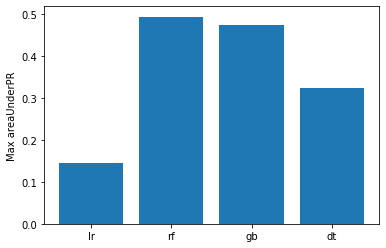

In [0]:
fig, ax = plt.subplots()
ax.bar(x=list(best_results.keys()), height=list(best_results.values()))
ax.set_ylim()
ax.set_ylabel('Max areaUnderPR')
ax.set_xlabel('')

In [0]:
best_results.values()

Out[6]: dict_values([0.14464419473962034, 0.49296223828851093, 0.47280146610452956, 0.3236020983992772])

##### Select the Best Model

In [0]:
# Select the model with the highest score
all_models = [cvModel_lr, cvModel_rf, cvModel_gb, cvModel_dt]

best_model_type = max(best_results, key=best_results.get)

if best_model_type =='lr':
  index = 0
elif best_model_type == 'rf':
  index = 1
elif best_model_type == 'gb':
  index = 2
else:
  index = 3

best_model = all_models[index]
print(index)

## Evaluation on Test

In [0]:
#Load Data
df_test = spark.read.csv('/FileStore/tables/ash_test/test_data.csv', schema=my_schema, header = 'true')
# df.printSchema()
# display(df_test)
df_test = df_test.persist()

In [0]:
# Preprocess the test dataset
df_test_preprocess = pre_process(df_test)

df_temp = df_test_preprocess.drop(*['class_ohe'])
# display(df_temp.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df_temp.columns]))

# Drop correlated Columns
df_test_processed_new = df_test_preprocess.drop(*to_drop)

In [0]:
def scale_test(df, scalerModel):
  
  df_temp = df.drop(*['label'])
  assembler = VectorAssembler(inputCols=df_temp.columns, outputCol='assembled_features') 
  assembled = assembler.transform(df)
  scaledData = scalerModel.transform(assembled)
  new_features = scaledData.select('scaledFeatures', 'label')

  return new_features


# StandardScale test set
df_test_scale = scale_test(df_test_processed_new, scalerModel)
# PCA Reduction
df_test_pca = pca_model.transform(df_test_scale)

In [0]:
display(df_test_pca)

scaledFeatures,label,pcaFeatures
"List(1, 31, List(), List(0.22749974537253453, 2.5645268549160147, -0.007421013635659356, -0.37167950108220943, -0.6036012240995171, -1.4138443679632513, 1.5028158613567886, -1.1140435754487603, -0.08171507532448403, -0.08912889901755408, -0.007166625896500989, -0.0034900467109045684, -0.0067439281882774324, -0.0075962673289636795, -0.002896740256564266, -0.00608209859938108, -0.0025386619319781906, -0.003037410171021357, -1.8247797777429073, -0.15885778576273032, -2.888865963072806, -0.1732823230222177, -0.14671809581853254, 7.148584792997801, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0,"List(1, 22, List(), List(-2.360934091558405, 0.9358621668367295, 2.034314644571498, -0.32304613124348847, 1.7092003760945915, -0.21094696656287573, -2.1779805952535796, 3.646570333753845, 2.240060449381465, 2.741048638238192, -4.279433575069399, 0.08071613202029446, 2.3036276912474762, -1.017905751929664, -0.20242764930612225, -0.09943987959577974, -0.4726780232160813, 0.7335193448066626, -0.028522062058048362, -1.9432996966447442, -0.17186673506320718, 0.025385089582501155))"
"List(1, 31, List(), List(0.30249683675708133, -1.4176499580470643, -4.752258769913489E-4, 0.20931754832995003, -1.1910419142767237, 0.8136875805083981, -0.7205369816098054, 0.4959198787735281, -0.48737325327996417, 0.49861713492758897, -0.007166625994120198, -0.003490046699885476, -0.0067439281830371615, -0.007596258125011085, -0.0028964723280623396, -0.006082098593329694, -0.0025386615546280416, -0.003037410169507455, 1.1749633266807258, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0,"List(1, 22, List(), List(0.9567082165987989, -0.4595586700435398, -0.8349811157663862, 0.05239695450442053, -0.1279114771055422, 0.11178885216282598, 0.27703637873255826, -1.0165335030941751, -1.0829800852040843, -0.35572039670577416, -0.2887101865260711, 0.3101670667844453, -0.03272933159016217, 0.3055888396808903, 0.1327595608011757, -0.02247669319782215, -0.9709294585542576, 0.8263987439847453, 0.2839642327540583, -0.2987147549169844, 0.00976456425131675, -0.015166285889066936))"
"List(1, 31, List(), List(1.0474679445102577, 0.6765270575532608, -0.0071960407454986445, -0.15345671682321807, -0.8546406164468113, -0.8531661760675799, 1.254906597384931, 1.6160327034498865, -0.09656097460738475, -2.146913868824202, -0.007141766637470232, -0.0034849935036411683, -0.0067369484401185505, -0.007307856914247754, -0.002640432801447695, -0.006082071692168611, -0.002297118024579103, -0.003036758554055456, 0.5380448547489323, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0,"List(1, 22, List(), List(-0.3041008954175114, -0.018074203001473044, -0.6344818875678659, 0.113673208978056, -0.7219747166776785, 6.67237006775962E-4, -0.2781930644633904, -0.03053729067849746, 1.4932140039296118, -0.04706191852578481, -0.2804378581033321, 0.22961767206392514, 0.06599191121799004, -0.24448292035029895, -0.09504375935664133, 0.004608645348458406, -0.21936306166714134, 0.5721621385667802, 2.431204137665774, 1.2444152275237825, 0.12087389738271587, -0.09762934098943105))"
"List(1, 31, List(), List(3.116276598703268, 1.6498674072255297, -0.03346093126549188, -0.6063551429207317, 1.415929443708412, 1.8259070546943594, -0.6084424022971968, 0.7583881424938265, 3.2370650530020666, 0.20826160561158694, -0.007166617335538898, -0.003490046707399258, -0.006743927788824955, -0.007595975374364223, -0.0028967581032544086, -0.006082098596343731, -0

In [0]:
predictions = best_model.transform(df_test_pca)

In [0]:
#predictions
display(predictions)

scaledFeatures,label,pcaFeatures,rawPrediction,probability,prediction
"List(1, 31, List(), List(0.22749974537253453, 2.5645268549160147, -0.007421013635659356, -0.37167950108220943, -0.6036012240995171, -1.4138443679632513, 1.5028158613567886, -1.1140435754487603, -0.08171507532448403, -0.08912889901755408, -0.007166625896500989, -0.0034900467109045684, -0.0067439281882774324, -0.0075962673289636795, -0.002896740256564266, -0.00608209859938108, -0.0025386619319781906, -0.003037410171021357, -1.8247797777429073, -0.15885778576273032, -2.888865963072806, -0.1732823230222177, -0.14671809581853254, 7.148584792997801, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0,"List(1, 22, List(), List(-2.360934091558405, 0.9358621668367295, 2.034314644571498, -0.32304613124348847, 1.7092003760945915, -0.21094696656287573, -2.1779805952535796, 3.646570333753845, 2.240060449381465, 2.741048638238192, -4.279433575069399, 0.08071613202029446, 2.3036276912474762, -1.017905751929664, -0.20242764930612225, -0.09943987959577974, -0.4726780232160813, 0.7335193448066626, -0.028522062058048362, -1.9432996966447442, -0.17186673506320718, 0.025385089582501155))","List(1, 2, List(), List(49.99826923076923, 0.0017307692307692308))","List(1, 2, List(), List(0.9999653846153846, 3.461538461538462E-5))",0.0
"List(1, 31, List(), List(0.30249683675708133, -1.4176499580470643, -4.752258769913489E-4, 0.20931754832995003, -1.1910419142767237, 0.8136875805083981, -0.7205369816098054, 0.4959198787735281, -0.48737325327996417, 0.49861713492758897, -0.007166625994120198, -0.003490046699885476, -0.0067439281830371615, -0.007596258125011085, -0.0028964723280623396, -0.006082098593329694, -0.0025386615546280416, -0.003037410169507455, 1.1749633266807258, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0,"List(1, 22, List(), List(0.9567082165987989, -0.4595586700435398, -0.8349811157663862, 0.05239695450442053, -0.1279114771055422, 0.11178885216282598, 0.27703637873255826, -1.0165335030941751, -1.0829800852040843, -0.35572039670577416, -0.2887101865260711, 0.3101670667844453, -0.03272933159016217, 0.3055888396808903, 0.1327595608011757, -0.02247669319782215, -0.9709294585542576, 0.8263987439847453, 0.2839642327540583, -0.2987147549169844, 0.00976456425131675, -0.015166285889066936))","List(1, 2, List(), List(49.99999403319195, 5.966808051772259E-6))","List(1, 2, List(), List(0.9999998806638389, 1.1933616103544516E-7))",0.0
"List(1, 31, List(), List(1.0474679445102577, 0.6765270575532608, -0.0071960407454986445, -0.15345671682321807, -0.8546406164468113, -0.8531661760675799, 1.254906597384931, 1.6160327034498865, -0.09656097460738475, -2.146913868824202, -0.007141766637470232, -0.0034849935036411683, -0.0067369484401185505, -0.007307856914247754, -0.002640432801447695, -0.006082071692168611, -0.002297118024579103, -0.003036758554055456, 0.5380448547489323, -0.15885778576273032, 0.34615612912294846, -0.1732823230222177, -0.14671809581853254, -0.1398876404616256, -0.11763002849924233, -0.09577627896878979, -0.09375998843889458, -0.0605756653308018, -0.04305285363664086, -0.023221505251837825, -0.007853307206204191))",0.0,"List(1, 22, List(), List(-0.3041008954175114, -0.018074203001473044, -0.6344818875678659, 0.113673208978056, -0.7219747166776785, 6.67237006775962E-4, -0.2781930644633904, -0.03053729067849746, 1.4932140039296118, -0.04706191852578481, -0.2804378581033321, 0.22961767206392514, 0.06599191121799004, -0.24448292035029895, -0.09504375935664133, 0.004608645348458406, -0.21936306166714134, 0.5721621385667802, 2.431204137665774, 1.2444152275237825, 0.12087389738271587, -0.09762934098943105))","List(1, 2, List(), List(49.99999403319195, 5.966

In [0]:
# Evaluate Predictions
def evaluate_predictions(predictions):
  binary_evaluator = BinaryClassificationEvaluator(labelCol='label')
  multi_evaluator = MulticlassClassificationEvaluator(labelCol='label')

  # Using Binary Classifier
  auroc = binary_evaluator.evaluate(predictions, {binary_evaluator.metricName: "areaUnderROC"})
  auprc = binary_evaluator.evaluate(predictions, {binary_evaluator.metricName: "areaUnderPR"})

  # Using Multiclass Classifier
  acc = multi_evaluator.evaluate(predictions, {multi_evaluator.metricName: "accuracy"})
  f1 = multi_evaluator.evaluate(predictions, {multi_evaluator.metricName: "f1"})
  weightedPrecision = multi_evaluator.evaluate(predictions, {multi_evaluator.metricName: "weightedPrecision"})
  weightedRecall = multi_evaluator.evaluate(predictions, {multi_evaluator.metricName: "weightedRecall"})

  # Using Multiclass Metrics
#   metrics = MulticlassMetrics(predictions.select(['prediction', 'label']).rdd.map(tuple))
  confusion_matrix = MulticlassMetrics(predictions.select(['prediction', 'label']).rdd.map(tuple)).confusionMatrix().toArray()
  
  return auroc, auprc, acc, f1, weightedPrecision, weightedRecall, confusion_matrix


In [0]:
auroc, auprc, acc, f1, weightedPrecision, weightedRecall, confusion_matrix = evaluate_predictions(predictions)
print(f"Area under ROC Curve: {auroc:.4f}")
print(f"Area under PR Curve: {auprc:.4f}")
print(f"Accuracy: {acc:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Weighted Precision: {weightedPrecision:.4f}")
print(f"Weighted Recall: {weightedRecall:.4f}")
print(f"Confusion Matrix: \n {confusion_matrix}")

Area under ROC Curve: 0.9979
Area under PR Curve: 0.4889
Accuracy: 0.9980
F1 Score: 0.9972
Weighted Precision: 0.9975
Weighted Recall: 0.9980
Confusion Matrix: 
 [[1.86007e+05 1.80000e+01]
 [3.62000e+02 5.10000e+01]]

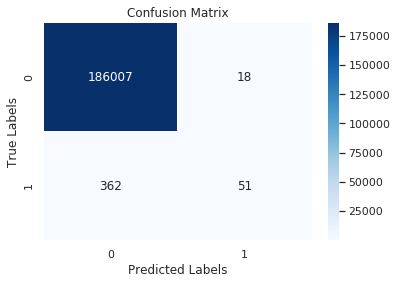

In [0]:
fig, ax = plt.subplots()
ax = sns.heatmap(confusion_matrix, annot=True, cmap=plt.cm.Blues, fmt='g').set(title='Confusion Matrix', xlabel='Predicted Labels', ylabel='True Labels')